# The objective of this project is to predict the Base MSRP (Manufacturer's Suggested Retail Price) of electric vehicles based on the features available, this will help buyers budgetting to project minimum cost of EV vehicles in the market without other add-ons

In [57]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,RANSACRegressor,SGDRegressor
from sklearn.preprocessing import StandardScaler,RobustScaler,LabelEncoder
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error,mean_absolute_percentage_error,max_error
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor 

In [58]:
df=pd.read_csv('Electric_Vehicle_Population_Data.csv')

In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239747 entries, 0 to 239746
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         239747 non-null  object 
 1   County                                             239744 non-null  object 
 2   City                                               239744 non-null  object 
 3   State                                              239747 non-null  object 
 4   Postal Code                                        239744 non-null  float64
 5   Model Year                                         239747 non-null  int64  
 6   Make                                               239747 non-null  object 
 7   Model                                              239747 non-null  object 
 8   Electric Vehicle Type                              239747 non-null  object

In [60]:
df.nunique()

VIN (1-10)                                            14122
County                                                  214
City                                                    793
State                                                    47
Postal Code                                             976
Model Year                                               21
Make                                                     46
Model                                                   173
Electric Vehicle Type                                     2
Clean Alternative Fuel Vehicle (CAFV) Eligibility         3
Electric Range                                          109
Base MSRP                                                31
Legislative District                                     49
DOL Vehicle ID                                       239747
Vehicle Location                                        974
Electric Utility                                         76
2020 Census Tract                       

In [61]:
df.describe().round(2)

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,239744.00,239747.00,239698.00,239698.00,239232.00,2.397470e+05,2.397440e+05
mean,98176.64,2021.46,45.56,770.53,28.88,2.363185e+08,5.297838e+10
std,2538.39,3.00,83.43,7096.68,14.90,6.765169e+07,1.557184e+09
min,1731.00,2000.00,0.00,0.00,1.00,4.385000e+03,1.001020e+09
25%,98052.00,2020.00,0.00,0.00,17.00,2.071293e+08,5.303301e+10
50%,98126.00,2023.00,0.00,0.00,32.00,2.533600e+08,5.303303e+10
75%,98375.00,2024.00,38.00,0.00,42.00,2.701756e+08,5.305307e+10
max,99577.00,2026.00,337.00,845000.00,49.00,4.792548e+08,5.602100e+10


In [62]:
df.head(10)

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,1C4JJXP68P,Yakima,Yakima,WA,98901.0,2023,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,21.0,0.0,15.0,249905295,POINT (-120.50729 46.60464),PACIFICORP,5.307700e+10
1,1G1FY6S03L,Kitsap,Kingston,WA,98346.0,2020,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,259.0,0.0,23.0,141133765,POINT (-122.4977 47.79802),PUGET SOUND ENERGY INC,5.303594e+10
2,KNDCE3LG9K,King,Seattle,WA,98125.0,2019,KIA,NIRO,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,239.0,0.0,46.0,3410074,POINT (-122.30253 47.72656),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303300e+10
3,1N4AZ0CP8E,Thurston,Olympia,WA,98506.0,2014,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84.0,0.0,22.0,182436474,POINT (-122.87741 47.05997),PUGET SOUND ENERGY INC,5.306701e+10
4,5YJXCAE29L,Kitsap,Silverdale,WA,98383.0,2020,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,293.0,0.0,23.0,1843054,POINT (-122.69275 47.65171),PUGET SOUND ENERGY INC,5.303509e+10
5,1G1FX6S02H,Kitsap,Kingston,WA,98346.0,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238.0,0.0,23.0,477830503,POINT (-122.4977 47.79802),PUGET SOUND ENERGY INC,5.303594e+10
6,7SAYGDEE4S,Thurston,Olympia,WA,98501.0,2025,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,0.0,22.0,275305593,POINT (-122.89166 47.03956),PUGET SOUND ENERGY INC,5.306701e+10
7,5YJSA1DG8D,Thurston,Olympia,WA,98512.0,2013,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,208.0,69900.0,35.0,188559976,POINT (-122.9131 47.01359),PUGET SOUND ENERGY INC,5.306701e+10
8,KNDJX3AE9G,Thurston,Olympia,WA,98506.0,2016,KIA,SOUL,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,93.0,31950.0,22.0,147089407,POINT (-122.87741 47.05997),PUGET SOUND ENERGY INC,5.306701e+10
9,5YJYGDEF7L,King,Seattle,WA,98146.0,2020,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,291.0,0.0,34.0,112896577,POINT (-122.36178 47.49408),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10


In [63]:
df.isna().sum()

VIN (1-10)                                             0
County                                                 3
City                                                   3
State                                                  0
Postal Code                                            3
Model Year                                             0
Make                                                   0
Model                                                  0
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                        49
Base MSRP                                             49
Legislative District                                 515
DOL Vehicle ID                                         0
Vehicle Location                                      10
Electric Utility                                       3
2020 Census Tract                                      3
dtype: int64

In [64]:
for col in ['County','City','Postal Code','Vehicle Location','Electric Utility']:
    df[col] = df[col].fillna('unknown')

In [65]:
for col in ['Electric Range','Base MSRP','Legislative District','2020 Census Tract']:
    df[col] = df[col].fillna(df[col].mean())

In [66]:
df.isna().sum()

VIN (1-10)                                           0
County                                               0
City                                                 0
State                                                0
Postal Code                                          0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
Legislative District                                 0
DOL Vehicle ID                                       0
Vehicle Location                                     0
Electric Utility                                     0
2020 Census Tract                                    0
dtype: int64

[Text(0.5, 0, 'Electric Range'),
 Text(1.5, 0, '2020 Census Tract'),
 Text(2.5, 0, 'Base MSRP'),
 Text(3.5, 0, 'Model Year')]

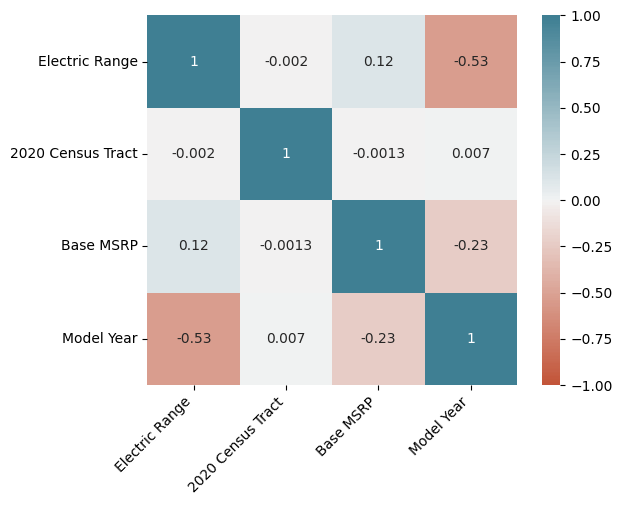

In [67]:
df3=df.loc[:,['Electric Range','Postal Code','City','2020 Census Tract','Base MSRP','County','Make','Model','Model Year','Electric Vehicle Type','State']]
corr = df3.corr(min_periods=5,numeric_only= True)
ax = sns.heatmap(
    corr,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220,  n=200),
    square=True,annot=True)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right')

[Text(0.5, 0, 'Electric Range'),
 Text(1.5, 0, 'Legislative District'),
 Text(2.5, 0, 'Base MSRP'),
 Text(3.5, 0, 'Model Year')]

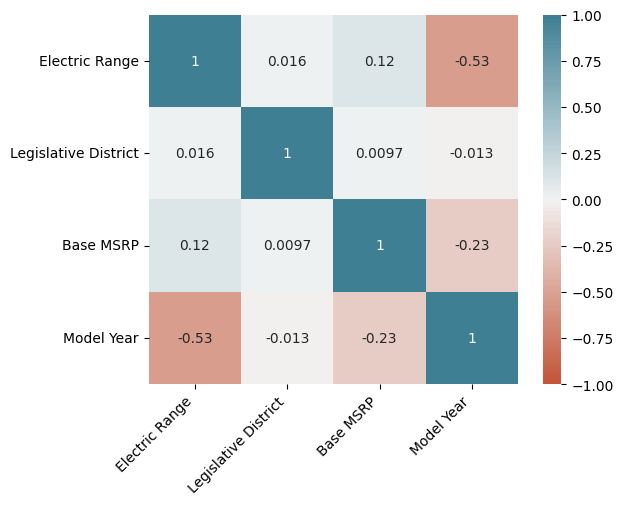

In [68]:
df4=df.loc[:,['Electric Range','Legislative District','Vehicle Location','Base MSRP','County','Make','Model','Model Year','Electric Vehicle Type','State']]
corr = df4.corr(min_periods=5,numeric_only= True)
ax = sns.heatmap(
    corr,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220,  n=200),
    square=True,annot=True)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right')

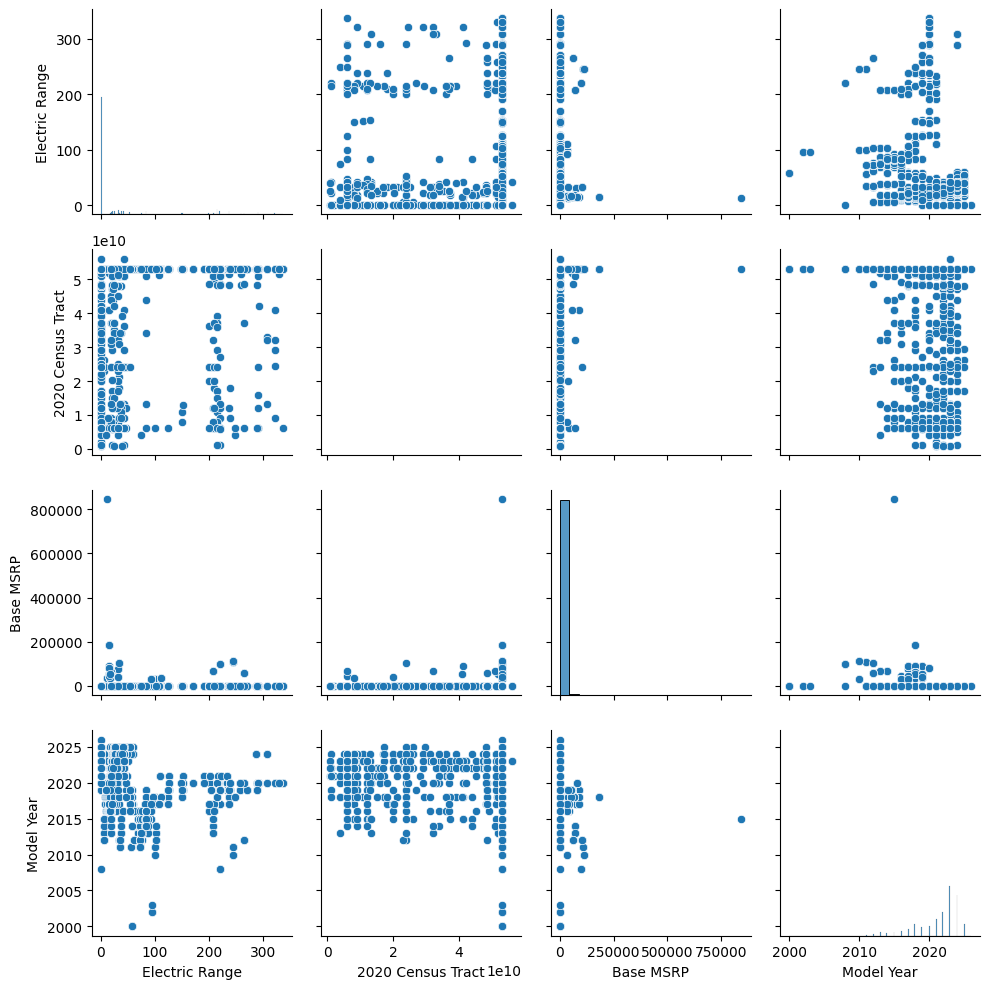

In [69]:
#scatterplot matrix to visualise important xteristics of dataset
col1=['Electric Range','Postal Code','City','2020 Census Tract','Base MSRP','County','Make','Model','Model Year','Electric Vehicle Type','State']

sns.pairplot(df[col1],height=2.5)
fig = plt.gcf()  # Get current figure
fig.tight_layout()
plt.show()

In [84]:
y=df['Base MSRP']
x=df.loc[:,['Model Year','2020 Census Tract','Make','Electric Range','Electric Vehicle Type']]
X_enc = pd.get_dummies(x,dtype=int,dummy_na='unknown',columns=['Make','Model Year','Electric Vehicle Type'])
display(X_enc.head(10))
display(x.shape)
display(X_enc.shape)

,2020 Census Tract,Electric Range,Make_ACURA,Make_ALFA ROMEO,Make_AUDI,Make_AZURE DYNAMICS,Make_BENTLEY,Make_BMW,Make_BRIGHTDROP,Make_CADILLAC,...,Model Year_2021.0,Model Year_2022.0,Model Year_2023.0,Model Year_2024.0,Model Year_2025.0,Model Year_2026.0,Model Year_nan,Electric Vehicle Type_Battery Electric Vehicle (BEV),Electric Vehicle Type_Plug-in Hybrid Electric Vehicle (PHEV),Electric Vehicle Type_nan
0,5.307700e+10,21.0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
1,5.303594e+10,259.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,5.303300e+10,239.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,5.306701e+10,84.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,5.303509e+10,293.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,5.303594e+10,238.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,5.306701e+10,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
7,5.306701e+10,208.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,5.306701e+10,93.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9,5.303301e+10,291.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


(239747, 5)

(239747, 74)

In [85]:
x_train,x_test,y_train,y_test=train_test_split(X_enc,y,test_size=0.33,random_state=20)

In [86]:
y_train.shape
y_test.shape
x_train.shape
x_test.shape

(79117, 74)

In [87]:
#I will use robust scaler for outliers
rob_trans = RobustScaler()
X_trans=rob_trans.fit_transform(x_train)
X_test=rob_trans.transform(x_test)

In [89]:
#Gradient boosting model
reg = GradientBoostingRegressor(random_state=0,n_estimators=250,max_depth=10)
reg.fit(X_trans, y_train)
reg.score(X_test, y_test)

0.9139509486333613

In [90]:
# calculate the R2 sq value which is the variance of output variable, the best outcome is 1.0
r2_score(y_test, reg.predict(X_test))

0.9139509486333613

In [91]:
 r2_score(y_train, reg.predict(X_trans))

0.9968682712558234

In [92]:
mean_absolute_error(y_test, reg.predict(X_test))

101.2479023011198

In [93]:
mean_absolute_percentage_error(y_test, reg.predict(X_test))

2.5333880065796422e+17

In [94]:
mean_absolute_error(y_train, reg.predict(X_trans))

15.346933743030924

In [95]:
mean_absolute_percentage_error(y_train, reg.predict(X_trans))

3.992460033355384e+16

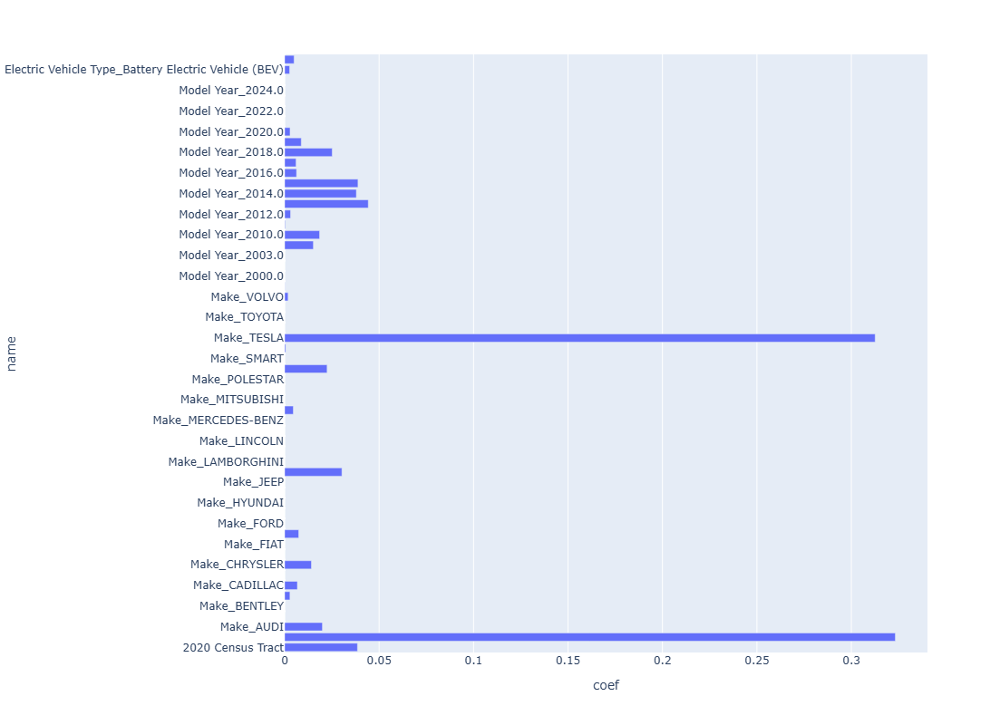

In [96]:
df_plot = pd.DataFrame({'coef':list(reg.feature_importances_),'name':x_train.columns})
px.bar(data_frame=df_plot[df_plot['coef'] > 0], x='coef',y='name',height=800)

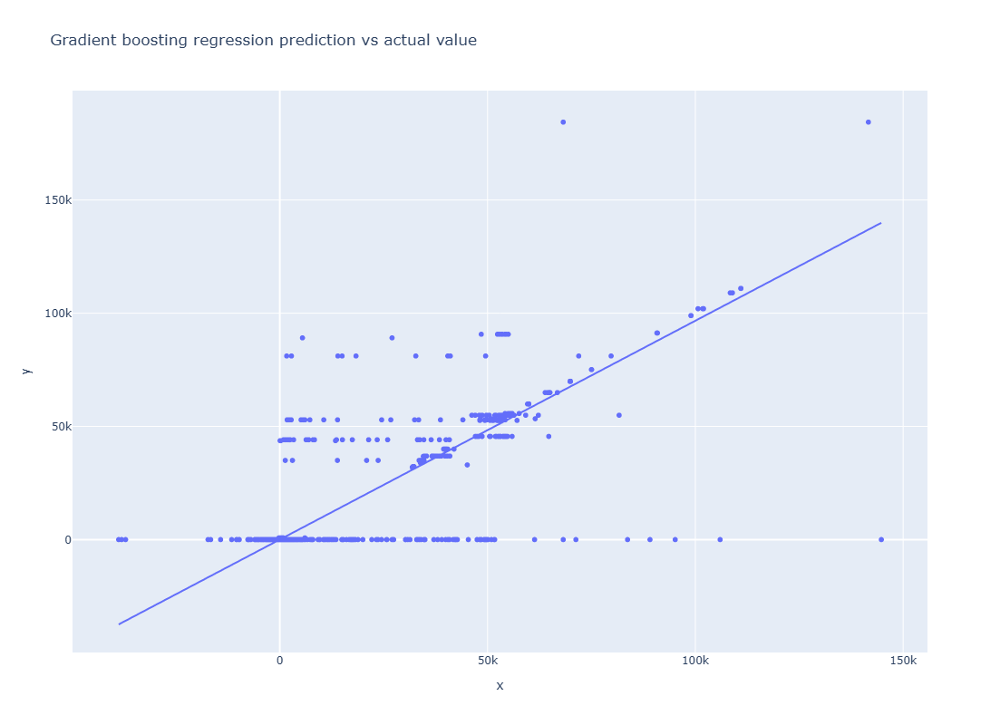

In [97]:
x_pred=reg.predict(X_test)
Gd_plot=px.scatter(x=x_pred,y=y_test,trendline='ols',title='Gradient boosting regression prediction vs actual value',height=800)
Gd_plot.show()